## 2. Blender tutorial

As it says on the tin, the 3d software [blender](https://www.blender.org/) is at the heart of `blender_tissue_cartography`. We will use it for visualization, mesh editing, and cartographic projection of surfaces (known as "UV mapping" in the graphics community).

Blender's user interface can be slightly overwhelming at first, but don't despair, it is very easy to learn. There are many great blender tutorials available on the web, and the manual can be found [here](https://docs.blender.org/manual/en/latest), from which most of the material in this tutorial is taken. Many people use blender, so when you have a question of the form "How do I do X in blender?", a Google search will probably answer it.

This tutorial is a **lightning overview of the part of blender's user interface relevant to tissue cartography**. We assume you are using blender 4.3.  We advise you to check out the blender manual and/or look at one of the many excellent YouTube tutorials if you have never used blender. Follow along by launching blender and opening a new, empty file:

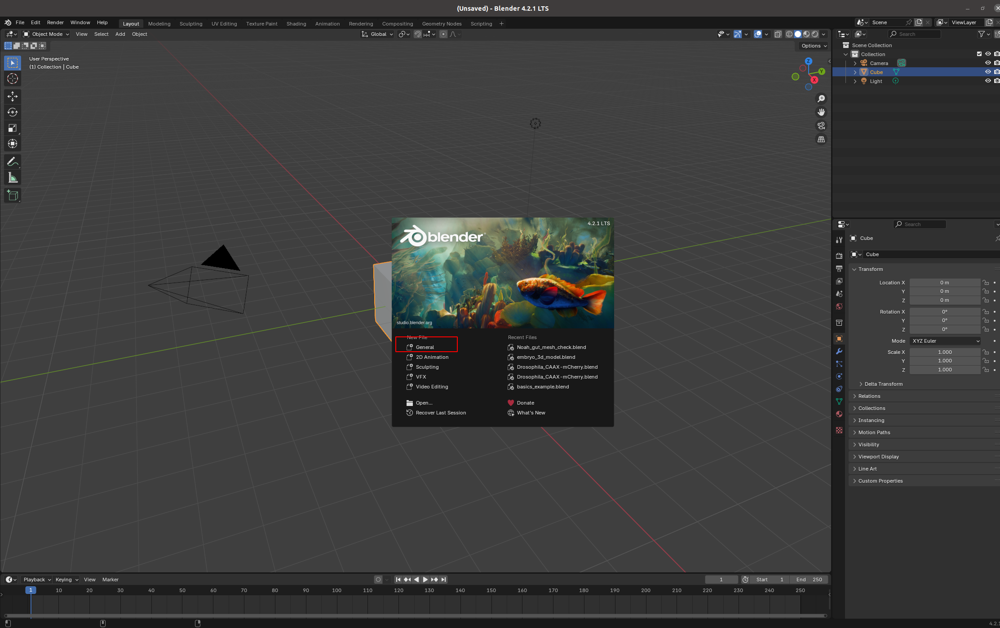

### Blender user interface

Your blender interface has three main parts:
- Top bar with the "File" menu for opening, saving, and exporting models, and the choice of the different "Workspaces"
- "Areas" in the middle, your workspace
- "Status Bar" at the bottom, shows relevant shortcuts and messages

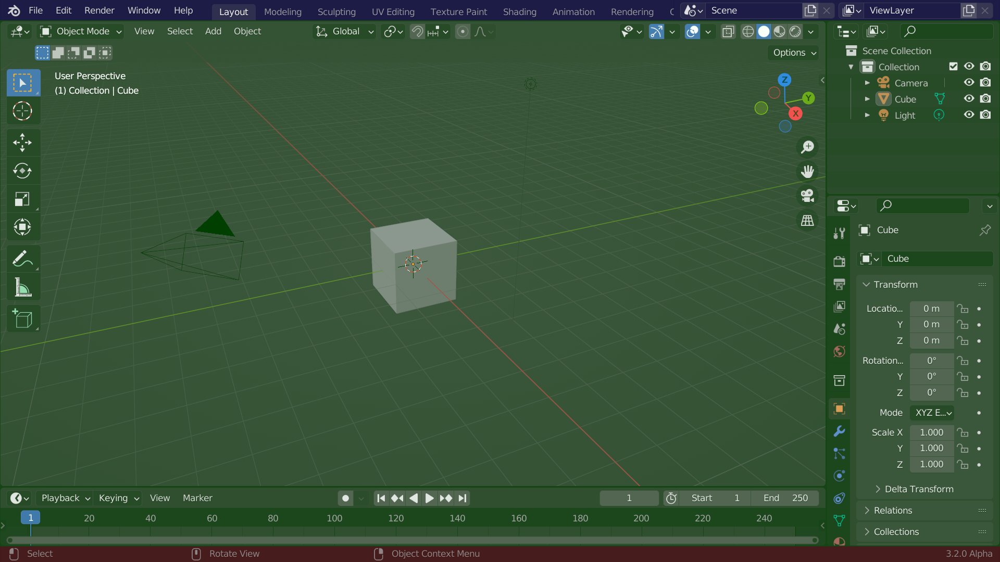

### Import a mesh

Let's import a mesh, namely the one created from ilastik in the preceding tutorial (`ilastik_example/basics_example_mesh_marching_cubes.obj`). You can either drag and drop it into blender, or click "File -> Import" on the top left.

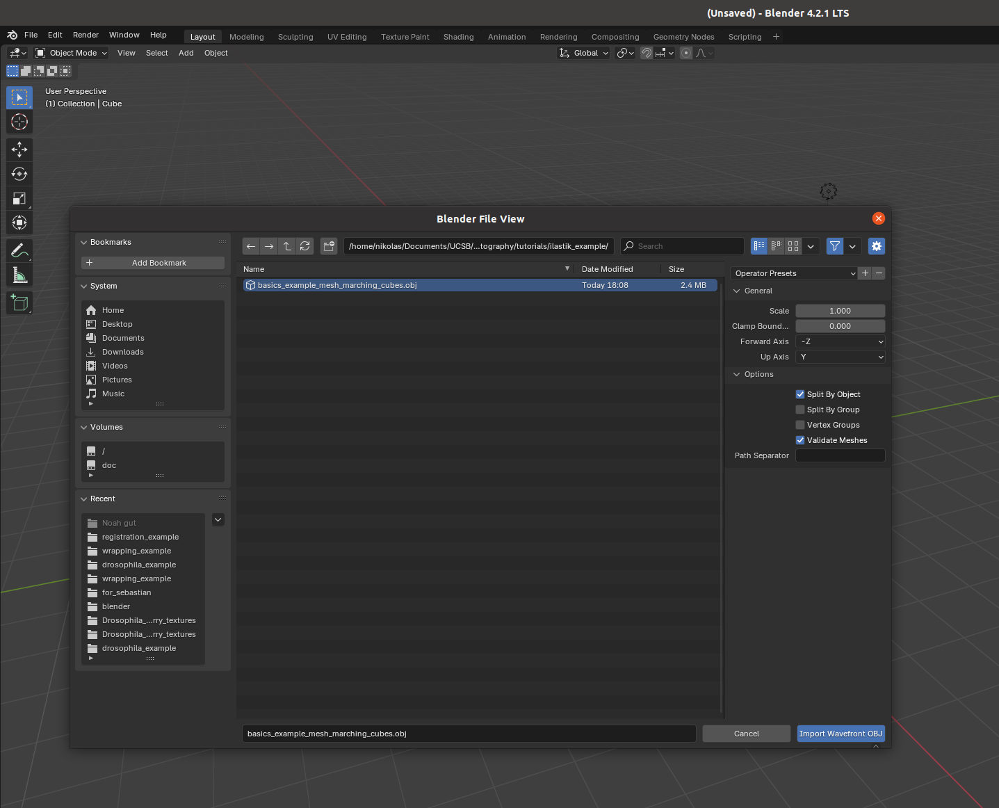

**Important: axis order** when importing a mesh into blender, you have to choose how blender interprets the $x,y,z$ axes. It is important to keep this choice consistent -  please select "Forward axis: Y" and "Up axis: Z"

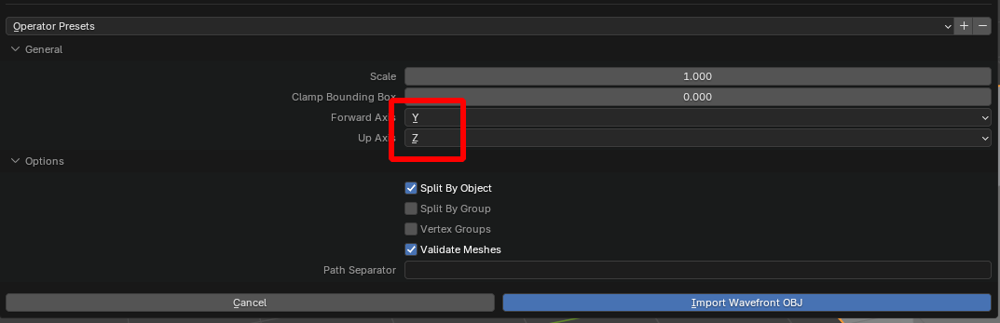



### Polygonal meshes

Blender and `blender_tissue_cartography` represents surfaces in 3D as polygonal meshes, that is collections of points (vertices), and edges and faces connecting them. You can see the vertices and faces by selecting "Wireframe" display option:

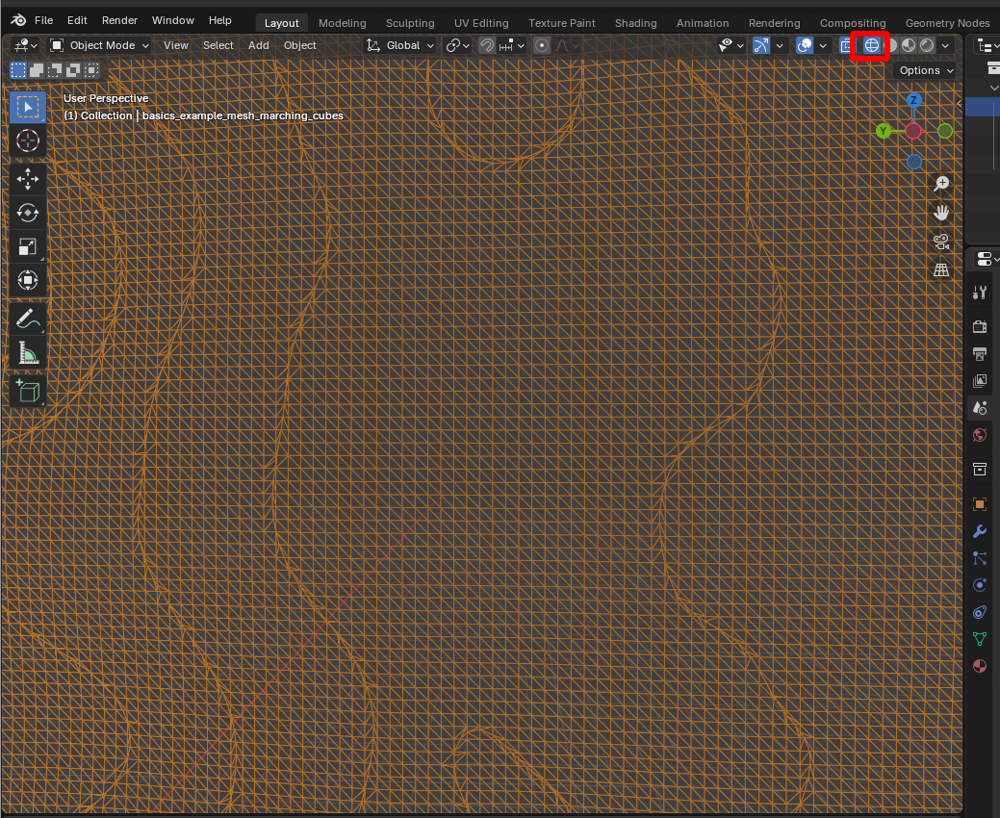


### Navigation

I strongly recommend using a full keyboard and mouse when operating blender. Use the scroll wheel to zoom in/out, click on an object to select it (it should be highlighted in orange), and use the Navigate gizmo to rotate the axes. Click the "hands" button to move your view.

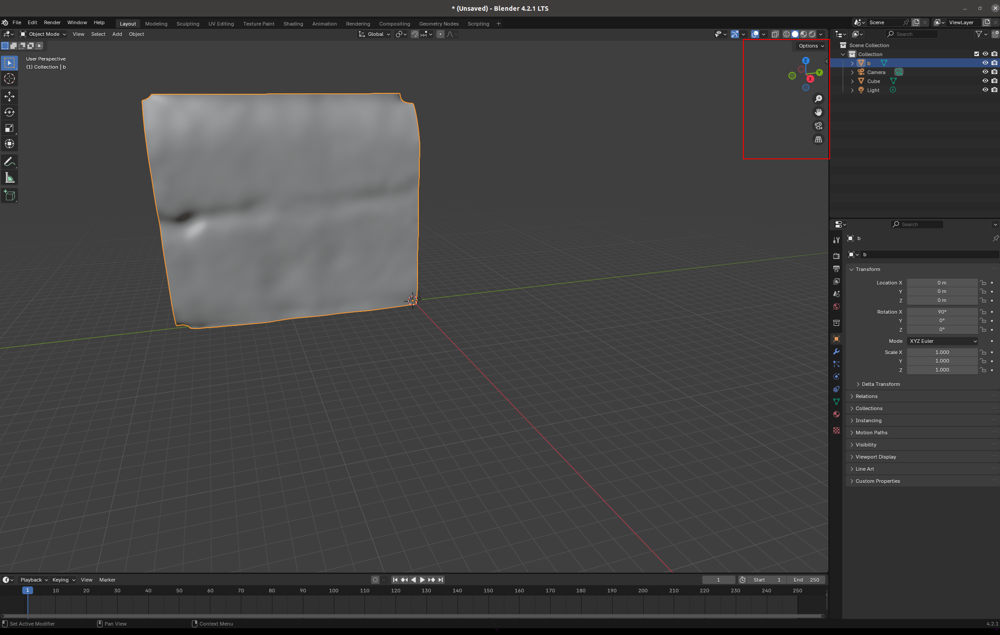

### Workspaces

Blender has different "workspaces" for different 3d tasks, selected using the top bar. Right now, we are in "Layout", a general-purpose workspace for viewing your blender scene. It has three main parts:
- "3d viewport" (center)
- "Outliner" (top right)
- "Properties" (bottom right)

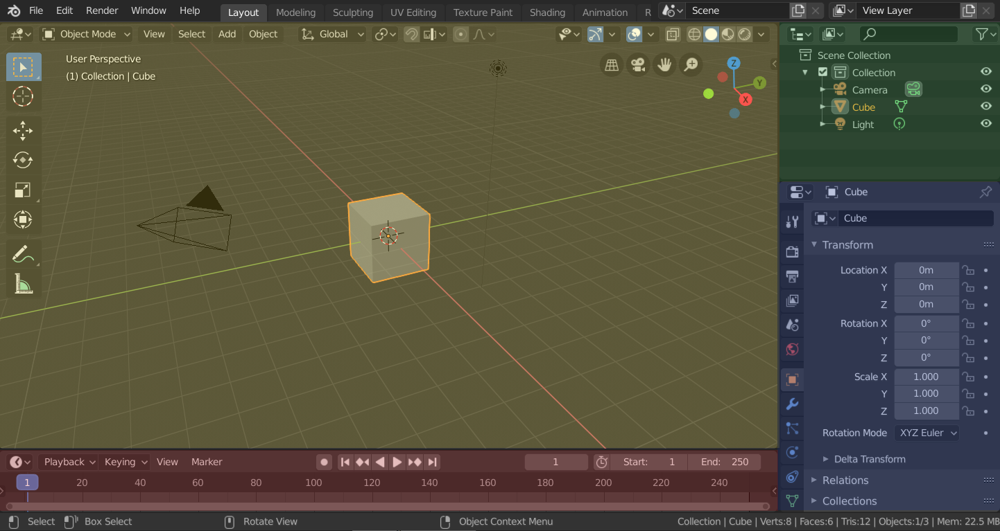


#### Outliner and Viewport options

In the top right corner of the user interface, you control what is in your scene and how it is shown:

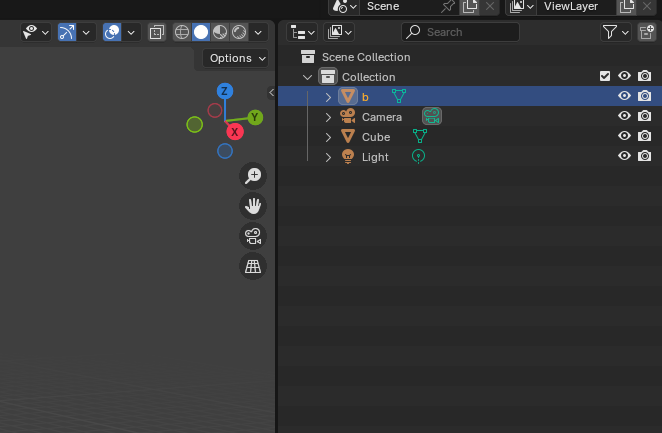

The outliner allows you to toggle the visibility of meshes and rename or delete them. The viewport options allow you to switch, for example, to wireframe rendering and toggle "x-ray", i.e. whether you can see and select "through" the mesh. Click on the circle with the lines to activate wireframe rendering.


#### Important properties

In the properties section of the user interface, you can select several tabs. The following are the most important for us:

- "Object": set position, scale, visibility, etc of your meshes. I recommend locking the mesh positions so you don't accidentally move your mesh, messing up the connection between mesh coordinates, and the underlying 3d image:

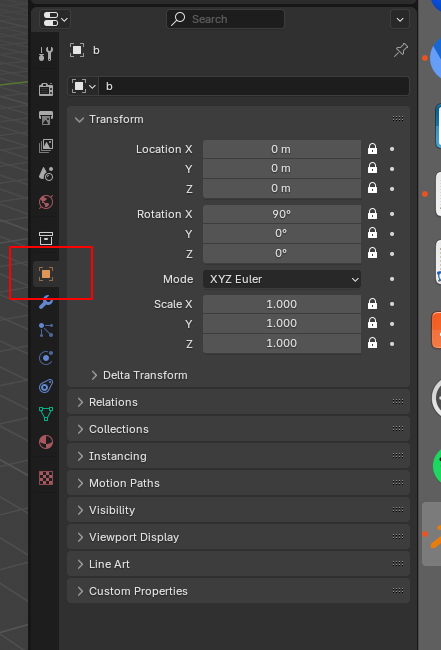

- "Modifier": apply filters/transformations to your mesh, for example smoothing or remeshing:

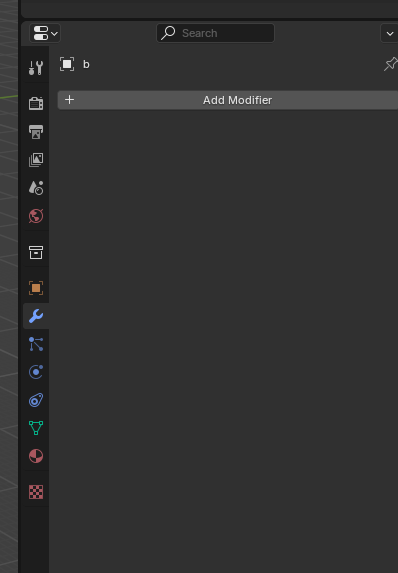

#### Important workspaces

We will mainly use the following three workspaces:
- "Layout"
- "UV editing"
- "Shading"

### UV editor

In the UV editor, we "unwrap" our mesh into a 2d square. The axes in the square are called $u, v$ to distinguish them from the 3d $x,y,z$ axes - hence the name "UV mapping". Go to the "UV editing" workspace now. You can see two main areas: the mesh in 3d on the right, and the UV square on the left. It is empty since we haven't unwrapped our mesh yet. Notice also that we are now in "Edit Mode", since we will edit a property of our mesh, the UV map:

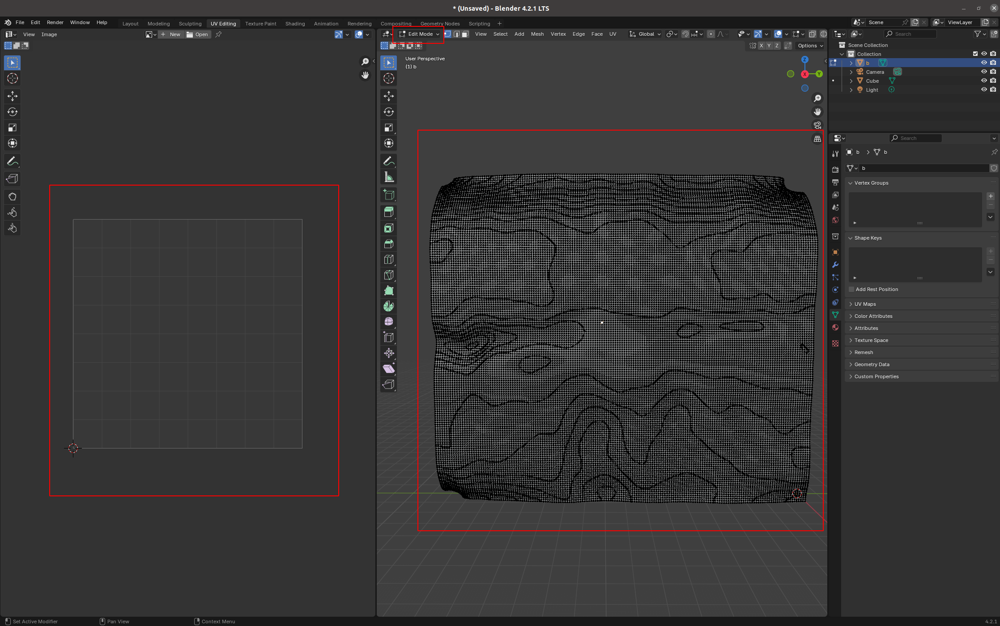

To unwrap the mesh, several algorithms can be used. Take a look at the [blender manual](https://docs.blender.org/manual/en/latest/editors/uv/introduction.html). In this example, our job is very simple, since the mesh is already basically flat.

We first select the part of the mesh we want to unwrap, in this case, the whole thing. Press "3" and "A" to select all faces of a mesh. Aside: a mesh is made out of vertices, edges, and faces. You can go into vertex, edge, and face select mode by pressing "1", "2", and "3". The mesh should light up orange. Now press "UV-> Unwrap":

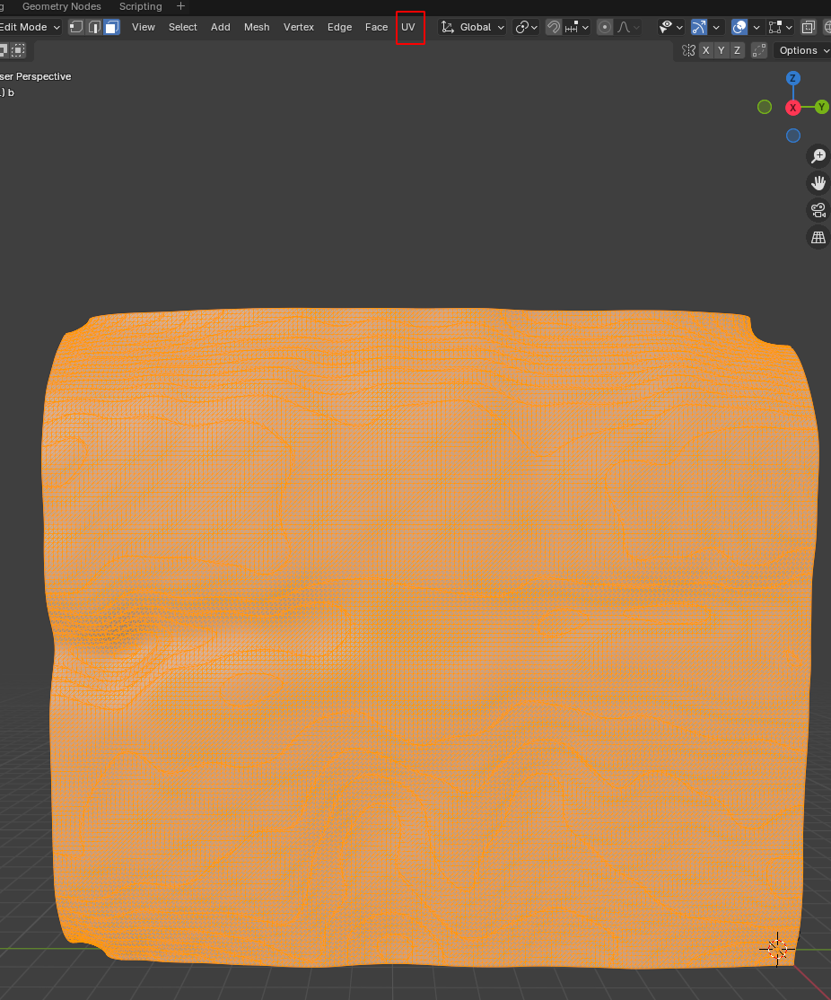



Congratulations - you have mapped your surface to the plane. You can now see it on the left, in the UV square:

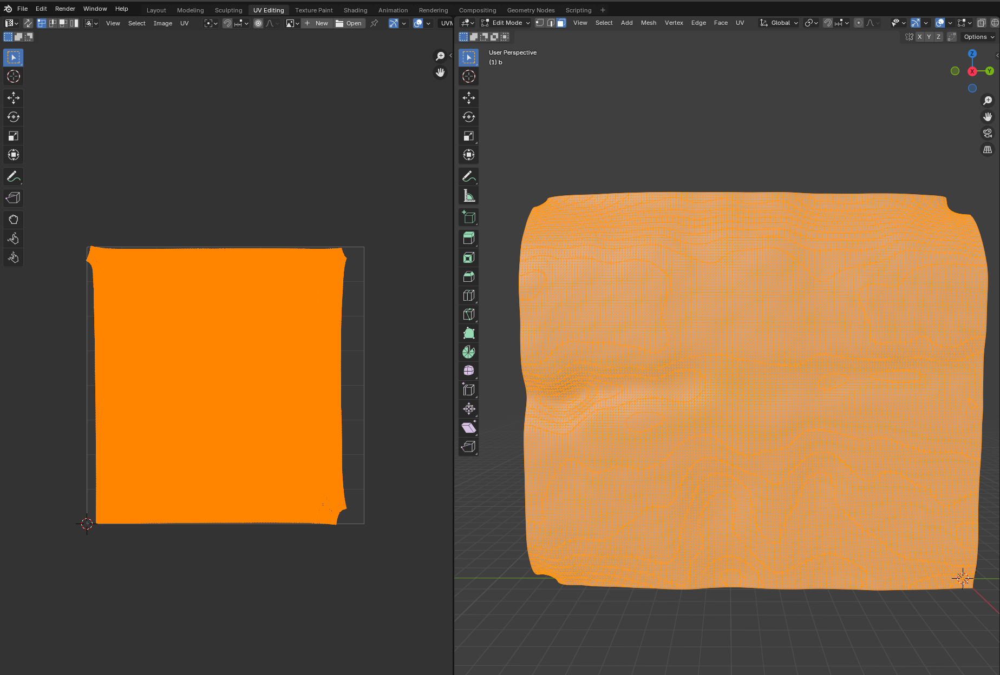

The UV editor has a lot of tools for post-processing UV maps created by an unwrapping algorithm, for example, the "Grab" brush. Try it:

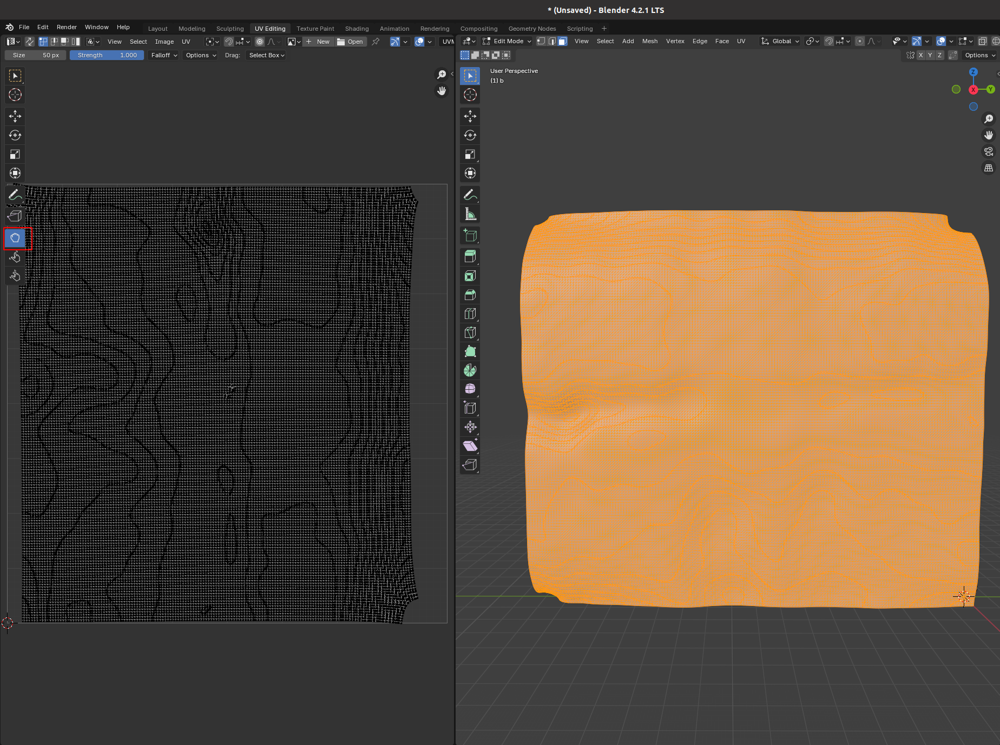

The "relax" brush is also very useful to reduce distortion.

### Shading

To visualize textures on the mesh, use the top bar to switch to the "Shading" workspace:

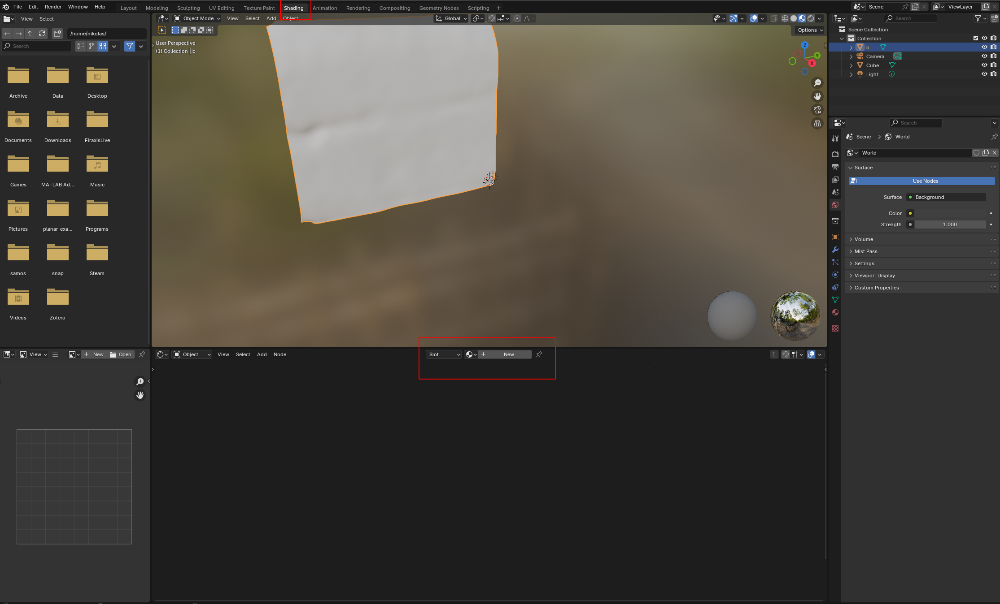

We will eventually use this to visualize the projected data extracted from our 3d `.tif` stack. But right now, let's just look at how shading works. Add a new material using the central button on the bottom area.

Materials define what the surface of a mesh looks like. Thanks to our UV map, we can take any square picture, and project it onto the 3d mesh. Let's go to our new material and add an empty image. Press "Shift-A" and search for "Image Texture". Click "New" - we will generate an image since we don't have any data yet. Select "Generated Type -> UV grid" to make a checkerboard pattern. This checkerboard pattern is very helpful to visualize the distortion of your UV map!

The result should look like this:
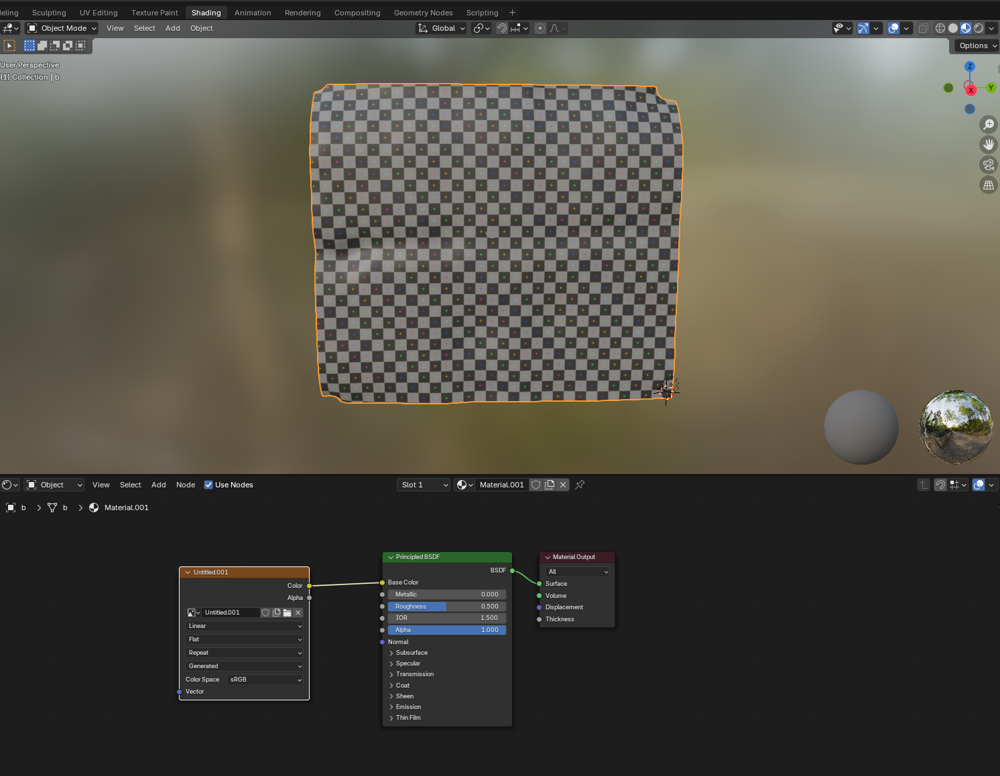

As you can see, the "Material" contains a bunch of different blocks connected by wires. This is blender's graphical programming language for defining materials. In our example, we have an input image, whose "color" output node is connected to the "base color" input node of a shader (Principled BSDF, which simulates how light reflects from our mesh). The shader output is connected to the material surface.  You can edit and reconnect the wiring using your mouse. Try to see what happens if you connect the image output directly to the "Surface" input node:

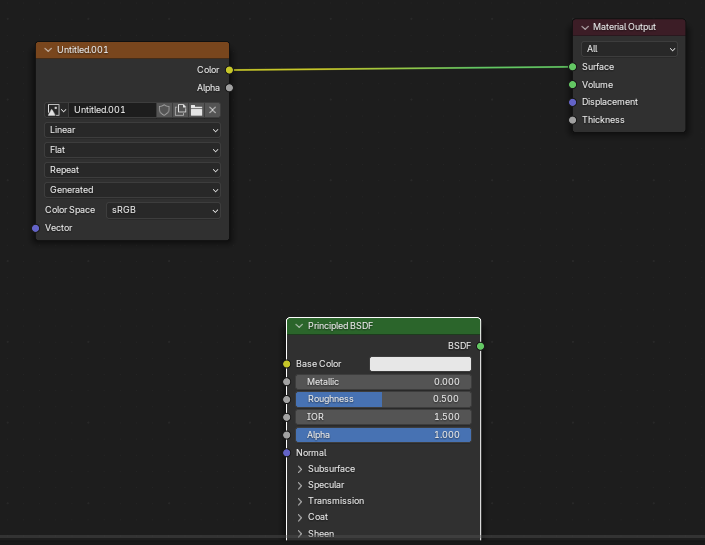
 


### Exporting meshes

We can now export our mesh together with its UV map. The exported mesh is the basis for the algorithm that carries out the cartographic projection of the 3d data, which you will see in the next tutorial notebook.

Click on "File -> Export" and export as `.obj`:

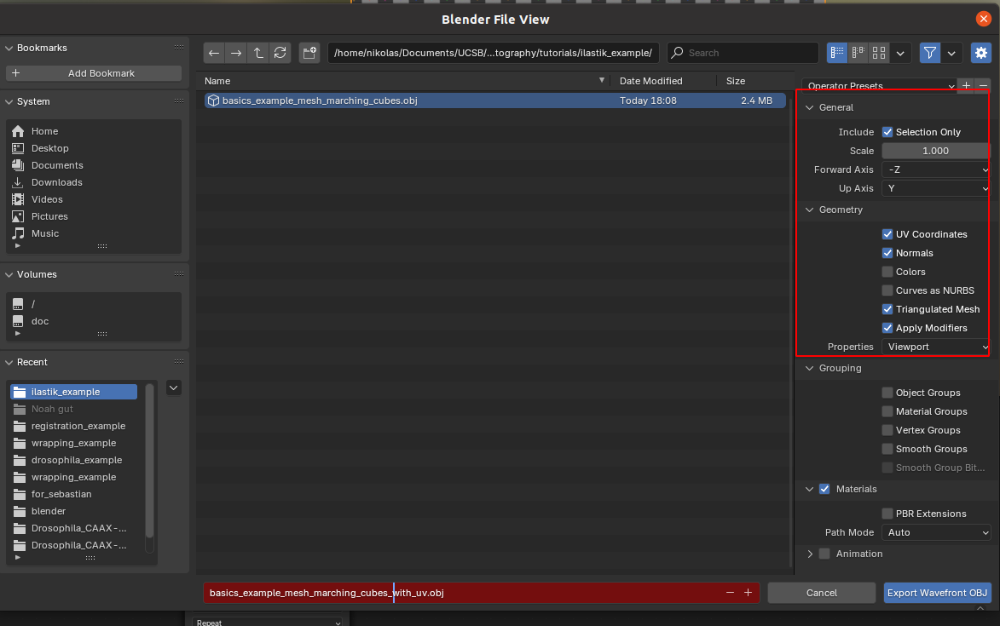

**Important: export settings**

- Always export as `.obj`
- Choose "Forwad axis: Y" and "Up axis: Z"
- Tick the box that says "Include Selection only" - otherwise you might export multiple meshes, and the subsequent algorithm does not know which one to use
- Include "UV coordinates" and "Normals" - this data will be important in the following
- Select **Triangulated Mesh** - the algorithms in this software package are designed to work with triangular meshes.
- Use a sensible name. You will need the filename in what comes next. I recommend using the name of the `.tif` image the mesh belongs to, plus some suffixes, like `_mesh_with_UV.obj`.

Save the blender file as a `.blend` project for further use, and close blender.

### Next steps

That's it! You now know the minimal amount of blender necessary to use `blender_tissue_cartography`. Move on to
`
- Tutorial 3 to learn how to use the `blender_tissue_cartography` add-on for tissue cartography fully within the Blender GUI

- Tutorial 4 to learn how to use the `blender_tissue_cartography` python library for custom or automated pipelines.

**Keep in mind**: blender is a powerful tool, in particular its UV Editor. We have barely scratched the surface of what it can do. Look at tutorials and the blender manual to see its full capabilities. Think twice before implementing UV mapping algorithms yourself in Python/MATLAB/... . Blender probably has a better implementation, a graphical user interface, and can be scripted in Python, as we will see in a later tutorial.